# Leitura, análise, limpeza e caracterização dos dados que serão usados.
# OBS: Análise dos dados de Tracking logo abaixo;
Lucas Albuquerque, Luca Kosfeld, Bernardo Venancio, Bruno Soares - GRUPO 8

In [1]:
import json
import bz2
import pandas as pd
import os
import pyarrow as pa
import pyarrow.parquet as pq
import psutil
from tqdm.notebook import tqdm
import time

## Criar csv já filtrado e amostragem de gráficos e histogramas.

In [5]:
import json
import os
import pandas as pd
import numpy as np 


DEFAULT_PITCH_LENGTH = 105.0 
DEFAULT_PITCH_WIDTH = 68.0   

# lista a ser extraida 
RELEVANT_EVENT_FEATURES = [
    "id", "period", "startTime", "gameClock", "gameEventType", "subType",
    "outcome", "startPointX", "startPointY", "endPointX", "endPointY",
    "duration", "heightType", "team", "player", "touches",
    "pressureType", "pressurePlayer",
    "possessionEvents",  # para acessar ballCarryEvent, challengeEvent etc.
    "videoUrl"  # útil para depuração e análise visual
]


TEAM_PLAYER_FEATURES = {
    "team_id": ("team", "id"),
    "team_name": ("team", "name"),
    "player_id": ("player", "id"),
    "player_name": ("player", "name"), 
    "player_firstName": ("player", "firstName"),
    "player_lastName": ("player", "lastName")
}

def safe_get_nested(data, keys, default=None):
    for key in keys:
        if isinstance(data, dict) and key in data and data[key] is not None:
            data = data[key]
        else:
            return default
    return data

def robust_float_conversion(value, default=np.nan):
    if value is None:
        return default
    try:
        return float(value)
    except (ValueError, TypeError):
        return default

def robust_int_conversion(value, default=0):
    if value is None:
        return default
    try:
        return int(float(value))
    except (ValueError, TypeError):
        return default

def extract_features_from_event_file(filepath):
    extracted_data_list = []
    game_id = None
    pitch_length = DEFAULT_PITCH_LENGTH
    pitch_width = DEFAULT_PITCH_WIDTH

    try:
        with open(filepath, 'r', encoding='utf-8') as f:
            data = json.load(f)

        if 'game' in data:
            game_meta = data['game']
            game_id = game_meta.get('id') # ID do Jogo

            # Tenta extrair dimensões do campo dos metadados do jogo
            if 'stadium' in game_meta and game_meta['stadium'] and 'pitches' in game_meta['stadium'] and \
               game_meta['stadium']['pitches'] and isinstance(game_meta['stadium']['pitches'], list) and \
               len(game_meta['stadium']['pitches']) > 0:
                pitch_info = game_meta['stadium']['pitches'][0] # Pega o primeiro campo listado
                pitch_length = robust_float_conversion(pitch_info.get('length'), DEFAULT_PITCH_LENGTH)
                pitch_width = robust_float_conversion(pitch_info.get('width'), DEFAULT_PITCH_WIDTH)

            game_events = game_meta.get('gameEvents', [])
        elif isinstance(data, list): # Caso o JSON seja diretamente uma lista de eventos
            game_events = data
            
        else:
            return [], game_id, pitch_length, pitch_width


        for event in game_events:
            if not isinstance(event, dict): continue # Pula se o evento não for um dicionário

            features = {"game_id": game_id, "pitch_length": pitch_length, "pitch_width": pitch_width}

            # Extrai características diretas do evento
            for feature_key in RELEVANT_EVENT_FEATURES:
                features[f"event_{feature_key}"] = event.get(feature_key) # Adiciona prefixo event_

            # Converte campos importantes para tipos numéricos de forma robusta
            features["event_period"] = robust_int_conversion(features.get("event_period"))
            features["event_startTime"] = robust_float_conversion(features.get("event_startTime"))
            features["event_gameClock"] = robust_float_conversion(features.get("event_gameClock"))
            features["event_startPointX"] = robust_float_conversion(features.get("event_startPointX"))
            features["event_startPointY"] = robust_float_conversion(features.get("event_startPointY"))
            features["event_endPointX"] = robust_float_conversion(features.get("event_endPointX"))
            features["event_endPointY"] = robust_float_conversion(features.get("event_endPointY"))
            features["event_duration"] = robust_float_conversion(features.get("event_duration"))


            #extrair caracteristicas do jogador e equipe
            for custom_key, path_keys in TEAM_PLAYER_FEATURES.items():
                features[custom_key] = safe_get_nested(event, path_keys)

            event_type = features.get("event_gameEventType")
            if event_type:
                features["is_recovery_attempt"] = event_type in ["BallRecovery", "Interception", "Tackle"]
                features["is_pass"] = event_type == "Pass"
                features["is_shot"] = event_type in ["Shot", "GoalAttempt"]
                features["is_carry"] = event_type == "Carry" # Ou "Dribble" dependendo do seu dataset

            start_x = features.get("event_startPointX")
            if start_x is not None and not np.isnan(start_x) and pitch_length > 0:
                if start_x < pitch_length / 3:
                    features["event_start_zone"] = "Defensive"
                elif start_x < 2 * pitch_length / 3:
                    features["event_start_zone"] = "Midfield"
                else:
                    features["event_start_zone"] = "Attacking"
            else:
                features["event_start_zone"] = None

            extracted_data_list.append(features)

        return extracted_data_list

    except FileNotFoundError:
        print(f"Erro: Arquivo não encontrado em {filepath}")
        return []
    except json.JSONDecodeError:
        print(f"Erro: Falha ao decodificar JSON do arquivo {filepath}")
        return []
    except Exception as e:
        print(f"Ocorreu um erro inesperado ao processar {filepath}: {e}")
        return []


def process_all_event_files_to_dataframe(folder_path):
    master_event_list = []

    if not os.path.isdir(folder_path):
        print(f"Erro: Pasta não encontrada em {folder_path}")
        return pd.DataFrame()

    files_to_process = [f for f in os.listdir(folder_path) if f.endswith(".json")]

    for filename in files_to_process:
        filepath = os.path.join(folder_path, filename)
        
        events_features = extract_features_from_event_file(filepath)
        
        if events_features:
            master_event_list.extend(events_features)
        else:
            print(f"Nenhuma característica de evento extraída de {filename}.")
            
    if not master_event_list:
        print("Nenhuma característica de evento foi extraída de nenhum arquivo.")
        return pd.DataFrame()

    # criar DataFrame
    df_events = pd.DataFrame(master_event_list)
    print(f"\nDataFrame final criado com {df_events.shape[0]} eventos e {df_events.shape[1]} colunas.")
    return df_events


if __name__ == "__main__":
    events_folder_path = '/Users/lucasalbuquerque/Desktop/CDAF_grupo8/Premier League 23-24' 

    if events_folder_path == 'sua_pasta_de_eventos' or not os.path.isdir(events_folder_path):
        script_dir = os.path.dirname(os.path.abspath(__file__) if '__file__' in locals() else os.getcwd())
        example_file_name = "13335_events.json" # O nome do arquivo que você forneceu
        potential_example_file_path = os.path.join(script_dir, example_file_name)
        
        temp_test_folder = os.path.join(script_dir, "temp_event_data_folder")

        if os.path.exists(potential_example_file_path):
            if not os.path.exists(temp_test_folder):
                os.makedirs(temp_test_folder, exist_ok=True)
            
            import shutil
            try:
                
                shutil.copy(potential_example_file_path, os.path.join(temp_test_folder, example_file_name))
                events_folder_path = temp_test_folder
                print(f"AVISO: 'events_folder_path' não estava configurado ou era inválido.")
                print(f"Usando pasta de teste temporária: {events_folder_path} com o arquivo de exemplo.")
            except Exception as e:
                print(f"Não foi possível copiar o arquivo para a pasta de teste: {e}")
                print("Por favor, configure 'events_folder_path' manualmente para a pasta contendo seus arquivos JSON.")
        else:
             print(f"AVISO: 'events_folder_path' ('{events_folder_path}') não é uma pasta válida ou não foi configurada.")
             print(f"E o arquivo de exemplo '{example_file_name}' não foi encontrado em '{script_dir}'.")
             print("Por favor, configure 'events_folder_path' manualmente.")


    if os.path.isdir(events_folder_path):
        df_all_events_features = process_all_event_files_to_dataframe(events_folder_path)

        if not df_all_events_features.empty:
            print("\n--- Informações do DataFrame Gerado ---")
            print("Primeiras 5 linhas do DataFrame:")
            print(df_all_events_features.head())
            print("\nTipos de dados das colunas:")
            print(df_all_events_features.info())
            print("\nEstatísticas descritivas básicas para colunas numéricas:")
            numeric_cols = df_all_events_features.select_dtypes(include=np.number).columns
            print(df_all_events_features[numeric_cols].describe())

            try:
                output_csv_path = "event_features_for_counter_attack_analysis.csv"
                df_all_events_features.to_csv(output_csv_path, index=False)
                print(f"\nDataFrame salvo em: {output_csv_path}")
            except Exception as e:
                print(f"Erro ao salvar DataFrame em CSV: {e}")
    else:
        print("\nNenhum processamento realizado pois a pasta de eventos não foi encontrada ou é inválida.")


DataFrame final criado com 525444 eventos e 34 colunas.

--- Informações do DataFrame Gerado ---
Primeiras 5 linhas do DataFrame:
  game_id  pitch_length  pitch_width  event_id  event_period  event_startTime  event_gameClock event_gameEventType event_subType event_outcome  event_startPointX  event_startPointY  event_endPointX  event_endPointY  event_duration event_heightType                                         event_team    event_player  event_touches event_pressureType event_pressurePlayer                             event_possessionEvents                                     event_videoUrl team_id               team_name player_id player_name player_firstName player_lastName  is_recovery_attempt  is_pass  is_shot  is_carry event_start_zone
0   13395         105.0         68.0  14798175             1         2118.100           2089.0                 OTB             S          None                NaN                NaN              NaN              NaN           0.000              

In [6]:
caminho_csv = 'event_features_for_counter_attack_analysis.csv'
df = pd.read_csv(caminho_csv)


pd.set_option('display.max_columns', None) 
pd.set_option('display.width', 1000)        


print(df.head(20))


    game_id  pitch_length  pitch_width  event_id  event_period  event_startTime  event_gameClock event_gameEventType event_subType  event_outcome  event_startPointX  event_startPointY  event_endPointX  event_endPointY  event_duration event_heightType                                         event_team     event_player  event_touches event_pressureType event_pressurePlayer                             event_possessionEvents                                     event_videoUrl  team_id               team_name  player_id  player_name  player_firstName  player_lastName  is_recovery_attempt  is_pass  is_shot  is_carry  event_start_zone
0     13395         105.0         68.0  14798175             1         2118.100           2089.0                 OTB             S            NaN                NaN                NaN              NaN              NaN           0.000                V  {'id': '3', 'name': 'Aston Villa', 'shortName'...   {'id': '4595'}            1.0                  P       {'id':

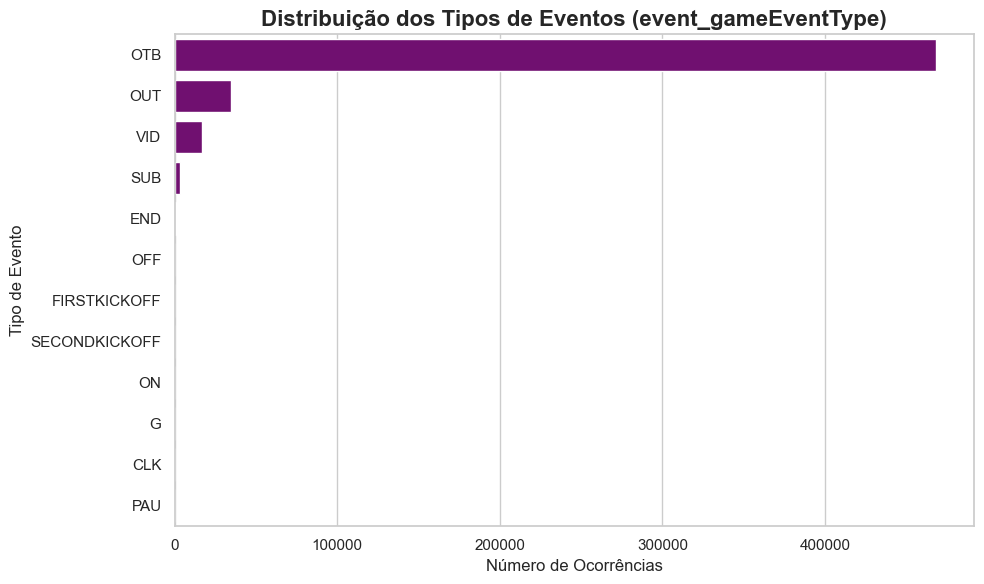

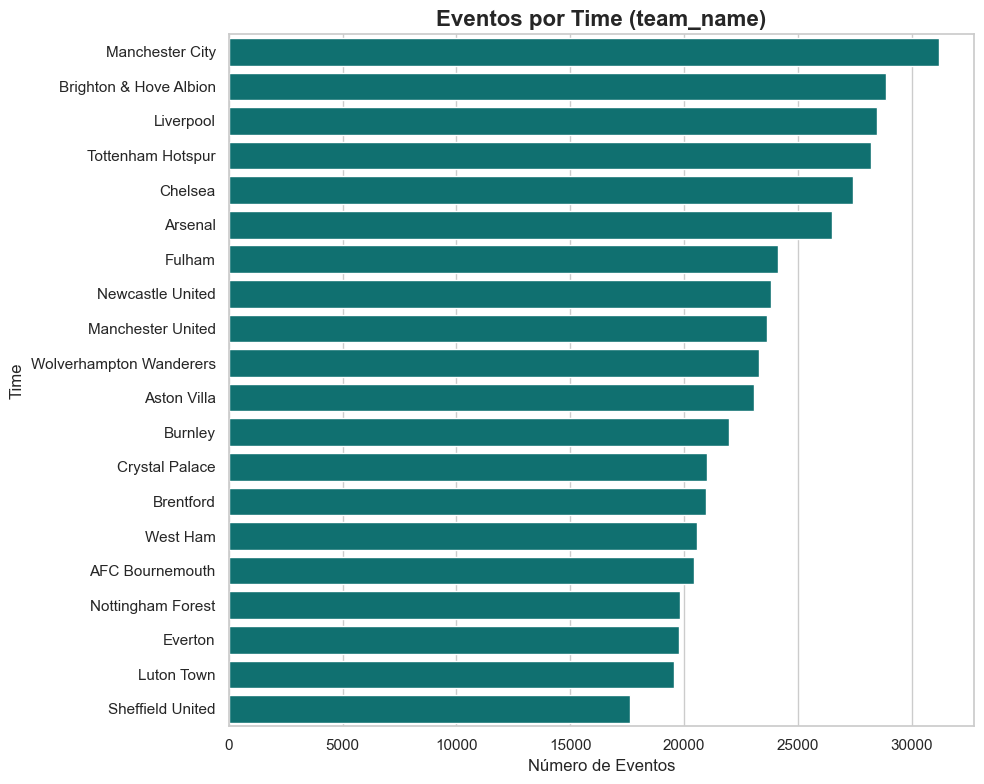

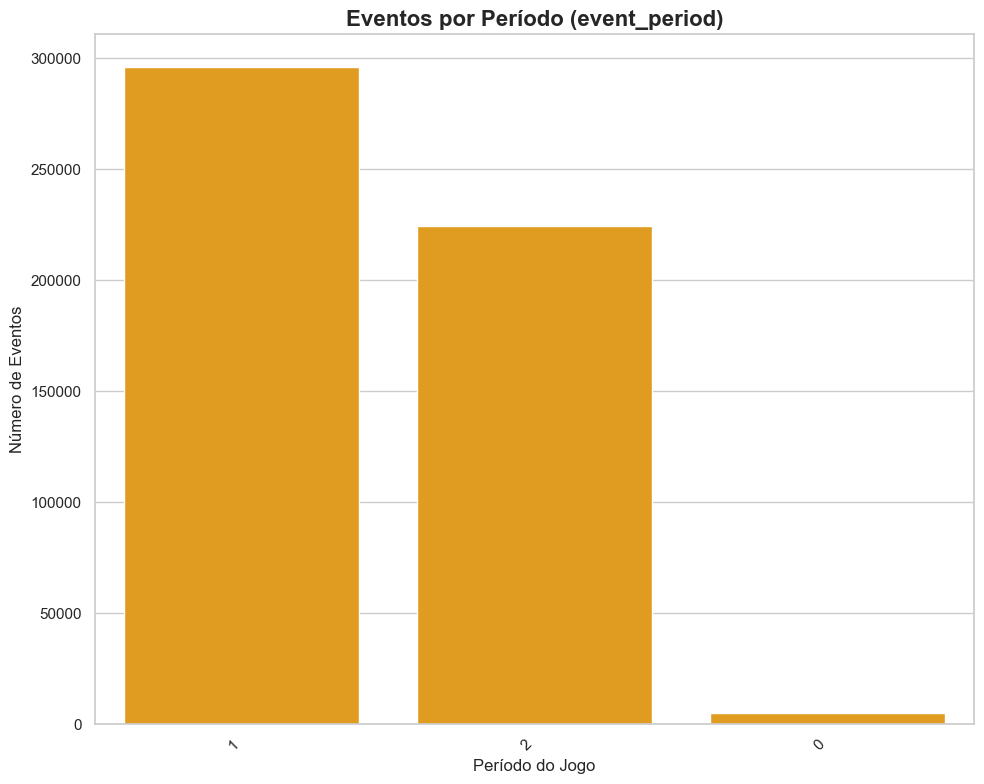

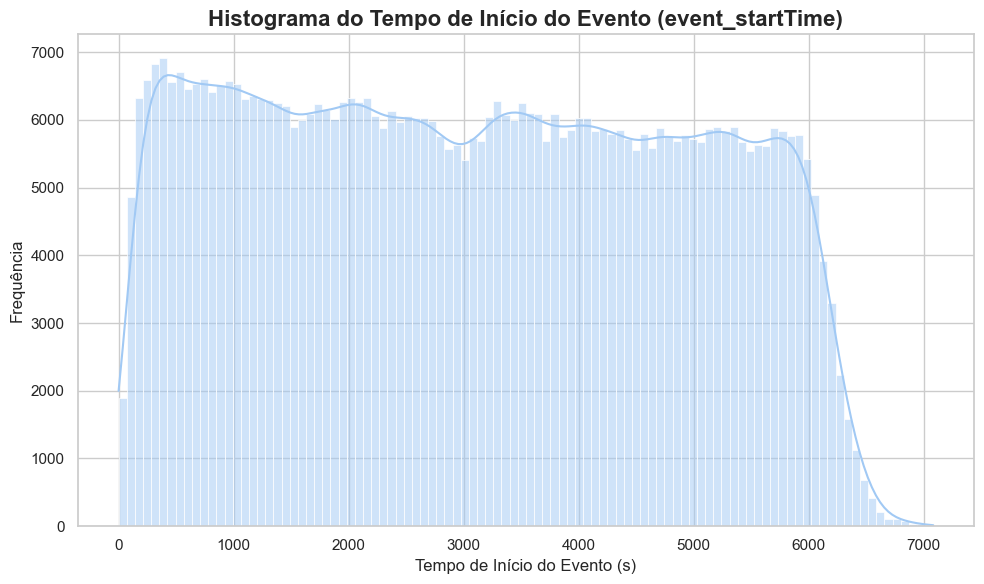

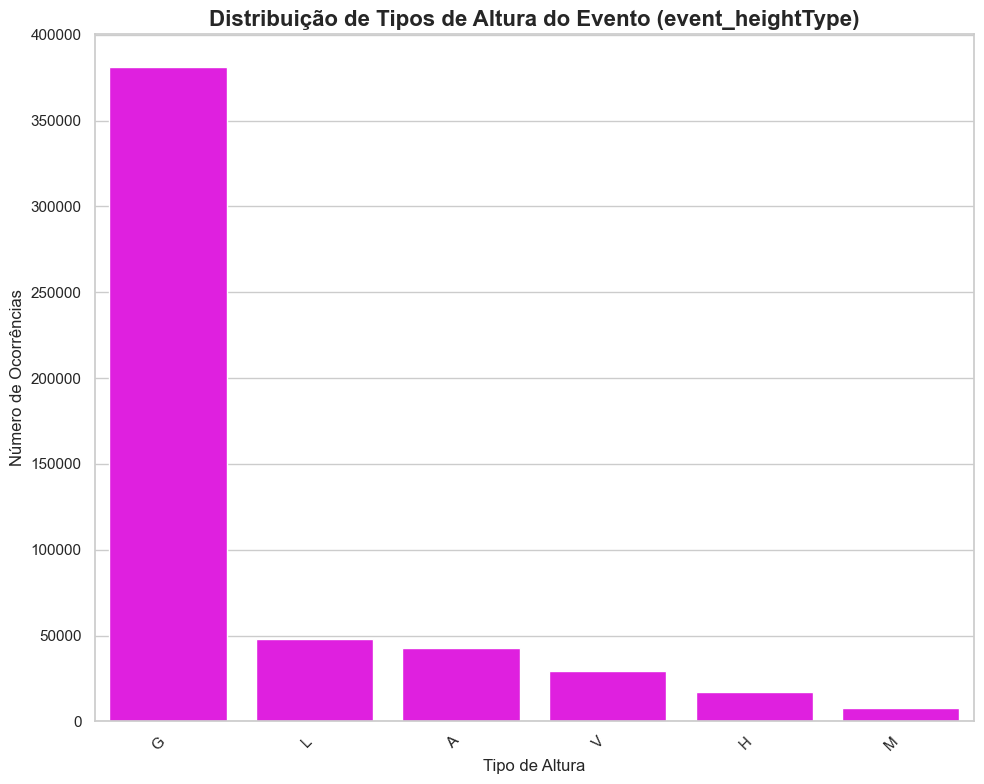

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


sns.set_theme(style="whitegrid", palette="pastel")

csv_file_path = 'event_features_for_counter_attack_analysis.csv'
df = None

df = pd.read_csv(csv_file_path)



def plot_bar_chart(data_series, title, xlabel, ylabel, top_n=15, color="skyblue", horizontal=True):
    if not isinstance(data_series, pd.Series) or data_series.empty:
        print(f"⚠️ Gráfico '{title}': Dados de entrada (Pandas Series) estão vazios ou são inválidos. Pulando.")
        return
    counts = data_series.nlargest(top_n)
    if counts.empty:
        print(f"⚠️ Gráfico '{title}': Nenhum dado para plotar após selecionar os top {top_n}. Pulando.")
        return
    plt.figure(figsize=(10, max(6, len(counts) * 0.4) if horizontal else 8))
    if horizontal:
        sns.barplot(x=counts.values, y=counts.index.astype(str), palette=color if isinstance(color, list) else None, color=color if not isinstance(color, list) else None, orient='h')
        plt.xlabel(ylabel, fontsize=12)
        plt.ylabel(xlabel, fontsize=12)
    else:
        sns.barplot(x=counts.index.astype(str), y=counts.values, palette=color if isinstance(color, list) else None, color=color if not isinstance(color, list) else None)
        plt.xlabel(xlabel, fontsize=12)
        plt.ylabel(ylabel, fontsize=12)
        plt.xticks(rotation=45, ha="right")
    plt.title(title, fontsize=16, weight='bold')
    plt.tight_layout()
    plt.show()
    plt.close()

def plot_histogram(data_series, title, xlabel, bins=30, x_range=None, kde=False):
    if not isinstance(data_series, pd.Series) or data_series.empty:
        print(f"⚠️ Histograma '{title}': Dados de entrada (Pandas Series) estão vazios ou são inválidos. Pulando.")
        return
    data_to_plot = data_series.dropna()
    if data_to_plot.empty:
        print(f"⚠️ Histograma '{title}': Nenhum dado para plotar após remover NaNs. Pulando.")
        return
    if x_range:
        data_to_plot = data_to_plot[(data_to_plot >= x_range[0]) & (data_to_plot <= x_range[1])]
        if data_to_plot.empty:
            print(f"⚠️ Histograma '{title}': Nenhum dado no intervalo {x_range} especificado. Pulando.")
            return
    plt.figure(figsize=(10, 6))
    sns.histplot(data_to_plot, bins=bins, kde=kde)
    plt.title(title, fontsize=16, weight='bold')
    plt.xlabel(xlabel, fontsize=12)
    plt.ylabel("Frequência", fontsize=12)
    plt.tight_layout()
    plt.show()
    plt.close()


#Distribuição de Tipos de Eventos
col_to_plot = 'event_gameEventType'
if col_to_plot in df.columns:
    data_counts = df[col_to_plot].value_counts()
    plot_bar_chart(data_counts, f'Distribuição dos Tipos de Eventos ({col_to_plot})',
                     'Tipo de Evento', 'Número de Ocorrências', top_n=15, color="purple")
else:
    print(f"⚠️ Coluna '{col_to_plot}' não encontrada. Pulando gráfico de tipos de eventos.")

#Eventos por Time
col_to_plot = 'team_name'
if col_to_plot in df.columns:
    data_counts = df[col_to_plot].dropna().value_counts()
    plot_bar_chart(data_counts, f'Eventos por Time ({col_to_plot})',
                     'Time', 'Número de Eventos', top_n=20, color="teal")
else:
    print(f"⚠️ Coluna '{col_to_plot}' não encontrada. Pulando gráfico de eventos por time.")

# Eventos por Período (event_period)
col_to_plot = 'event_period'
if col_to_plot in df.columns:
    data_counts = df[col_to_plot].astype(str).value_counts().sort_index()
    plot_bar_chart(data_counts, f'Eventos por Período ({col_to_plot})',
                     'Período do Jogo', 'Número de Eventos', top_n=5, color="orange", horizontal=False)
else:
    print(f"⚠️ Coluna '{col_to_plot}' não encontrada. Pulando gráfico de eventos por período.")

# hist do Tempo de Início do Evento (event_startTime)
col_to_plot = 'event_startTime'
if col_to_plot in df.columns and pd.api.types.is_numeric_dtype(df[col_to_plot]):
    plot_histogram(df[col_to_plot], f'Histograma do Tempo de Início do Evento ({col_to_plot})',
                   'Tempo de Início do Evento (s)', bins=100, kde=True)
else:
    print(f"⚠️ Coluna '{col_to_plot}' não encontrada ou não é numérica. Pulando histograma de tempo de início.")


# Distribuição de Tipos de Altura do Evento (event_heightType)
col_to_plot = 'event_heightType'
if col_to_plot in df.columns:
    data_counts = df[col_to_plot].value_counts()
    plot_bar_chart(data_counts, f'Distribuição de Tipos de Altura do Evento ({col_to_plot})',
                     'Tipo de Altura', 'Número de Ocorrências', top_n=10, color="magenta", horizontal=False)
else:
    print(f"⚠️ Coluna '{col_to_plot}' não encontrada. Pulando gráfico de tipos de altura.")


## Adição de Velocidade e Aceleração aos dados de tracking

In [13]:
import gandula
from gandula.export.dataframe import pff_frames_to_dataframe
from gandula.features.pff import add_ball_speed, add_players_speed



data_path, game_id = "C:/Users/lucas/OneDrive/Área de Trabalho/cdaf/PL_23_24", 13594

metadata_df, players_df = pff_frames_to_dataframe(
    gandula.get_frames(
        data_path,
        game_id,
    )
)

Loading frames from match 13594: 0 frames [00:00, ? frames/s]

Validating frames:   0%|          | 0/176195 [00:00<?, ? frames/s]

In [14]:
players_df = add_ball_speed(players_df)
players_df = add_players_speed(players_df)

Adding ball speed, velocity, and acceleration in each frame: 100%|██████████| 2/2 [00:01<00:00,  1.35it/s]
Adding player speed, velocity, and acceleration in each frame: 100%|██████████| 51/51 [00:01<00:00, 29.47it/s]


In [45]:


metadata_df.to_parquet(f"lucas/metadata.parquet", engine="fastparquet")
players_df.to_parquet(f"lucas/players.parquet", engine="fastparquet")

In [54]:
players_df.head()


,elapsed_seconds,frame_id,match_id,period,shirt,x,y,team,ball_x,ball_y,...,ball_vz,ball_speed,ball_ax,ball_ay,ball_az,vx,vy,ax,ay,speed
0,0.000288,1637,13594.0,1,5,16.005,-10.921,away,-0.10,-0.21,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.033655,1638,NaN,1,5,15.923,-10.882,away,-0.14,-0.32,...,1.798184,3.941903,NaN,NaN,NaN,-2.457518,1.168819,NaN,NaN,2.721311
2,0.067021,1639,NaN,1,5,15.923,-10.882,away,-0.14,-0.32,...,0.000000,0.000000,35.928467,98.803284,-53.892700,0.000000,0.000000,73.653357,-35.030255,0.000000
3,0.100388,1640,NaN,1,5,15.739,-10.808,away,-0.16,-0.43,...,1.498487,3.670527,-17.963695,-98.800323,44.909238,-5.514430,2.217760,-165.265994,66.465672,5.943686
4,0.133755,1641,NaN,1,5,15.739,-10.808,away,-0.16,-0.43,...,0.000000,0.000000,17.963695,98.800323,-44.909238,0.000000,0.000000,165.265994,-66.465672,0.000000


In [55]:
metadata_df.head()

,match_id,frame_id,period,elapsed_seconds,home_has_possession,event_id,event_type,event_setpiece_type,event_player_id,event_team_id,event_start_frame,event_end_frame,possession_id,possession_type,possession_start_frame,possession_end_frame,sequence,version,video_time_milli
0,13594.0,1637,1,0.000288,None,18067352.0,PFF_Frame_GameEventType.FIRST_KICK_OFF,nan,16785.0,20.0,1637.0,1637.0,17973359.0,Frame_PossessionEventType.PASS,1637.0,NaN,None,4.1.0,54621.288
1,NaN,1638,1,0.033655,None,NaN,nan,nan,NaN,NaN,NaN,NaN,NaN,nan,NaN,NaN,None,None,54654.655
2,NaN,1639,1,0.067021,None,NaN,nan,nan,NaN,NaN,NaN,NaN,NaN,nan,NaN,NaN,None,None,54688.021
3,NaN,1640,1,0.100388,None,NaN,nan,nan,NaN,NaN,NaN,NaN,NaN,nan,NaN,NaN,None,None,54721.388
4,NaN,1641,1,0.133755,None,NaN,nan,nan,NaN,NaN,NaN,NaN,NaN,nan,NaN,NaN,None,None,54754.755


# PITCH CONTROL

In [22]:
import pandas as pd

# Carrega os dados
players = pd.read_parquet("13594/players.parquet")
meta = pd.read_parquet("13594/metadata.parquet")

frame_id = 1640
frame_data = players[players['frame_id'] == frame_id].copy()

# Separar jogadores por time
team_A = frame_data[frame_data['team'] == 'home']
team_B = frame_data[frame_data['team'] == 'away']



In [4]:
import numpy as np

field_length = 105  # metros
field_width = 68

nx, ny = 100, 68
x = np.linspace(0, field_length, nx)
y = np.linspace(0, field_width, ny)
grid_x, grid_y = np.meshgrid(x, y)


In [6]:
def time_to_point(player_pos, grid, max_speed=5.5):
    dx = grid[0] - player_pos[0]
    dy = grid[1] - player_pos[1]
    distance = np.sqrt(dx**2 + dy**2)
    return distance / max_speed  # segundos


# calcular o pitch control

In [7]:
control_map = np.zeros(grid_x.shape)

def compute_pitch_control(team_A, team_B, grid_x, grid_y):
    control = np.zeros_like(grid_x)

    for i in range(grid_x.shape[0]):
        for j in range(grid_x.shape[1]):
            point = (grid_x[i, j], grid_y[i, j])
            t_A = np.min([time_to_point((p['x'] + field_length / 2, 
                                         p['y'] + field_width / 2), point)
                          for _, p in team_A.iterrows()])
            t_B = np.min([time_to_point((p['x'] + field_length / 2, 
                                         p['y'] + field_width / 2), point)
                          for _, p in team_B.iterrows()])

            # Logística: probabilidade de controle do time A
            k = 4.3
            p_A = 1 / (1 + np.exp(k * (t_B - t_A)))
            control[i, j] = p_A

    return control


# plotar


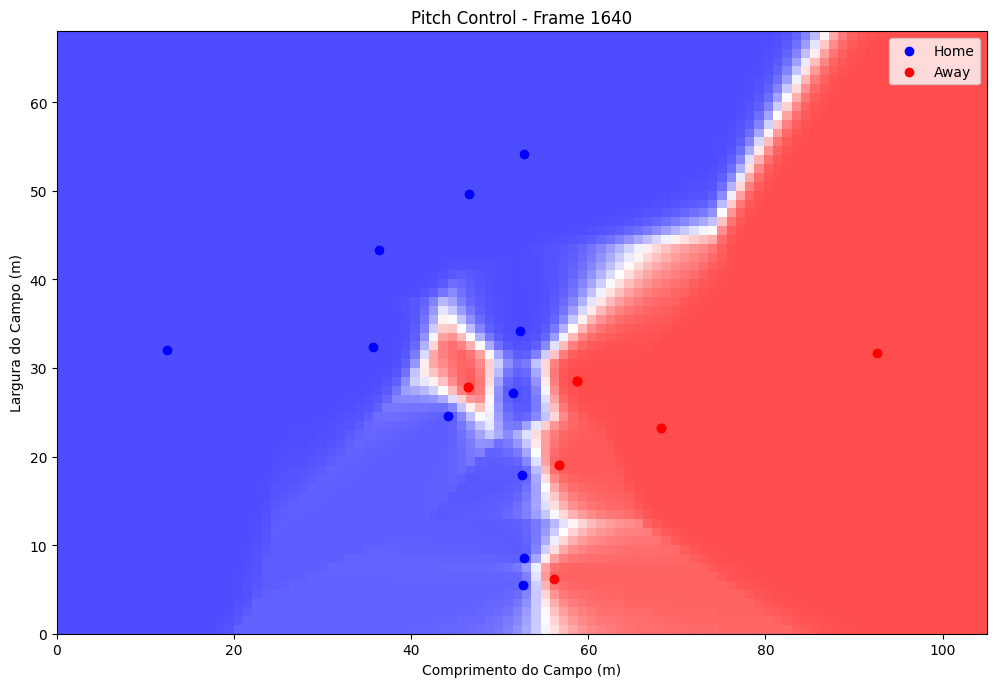

In [9]:
import matplotlib.pyplot as plt

control_map = compute_pitch_control(team_A, team_B, grid_x, grid_y)

plt.figure(figsize=(12, 8))
plt.imshow(control_map, extent=[0, 105, 0, 68], origin='lower', cmap='bwr', alpha=0.7)
plt.title(f"Pitch Control - Frame {frame_id}")
plt.xlabel("Comprimento do Campo (m)")
plt.ylabel("Largura do Campo (m)")

# Plotar jogadores
plt.scatter(team_A['x'] + 52.5, team_A['y'] + 34, c='blue', label='Home')
plt.scatter(team_B['x'] + 52.5, team_B['y'] + 34, c='red', label='Away')
plt.legend()
plt.show()


# alguns frames


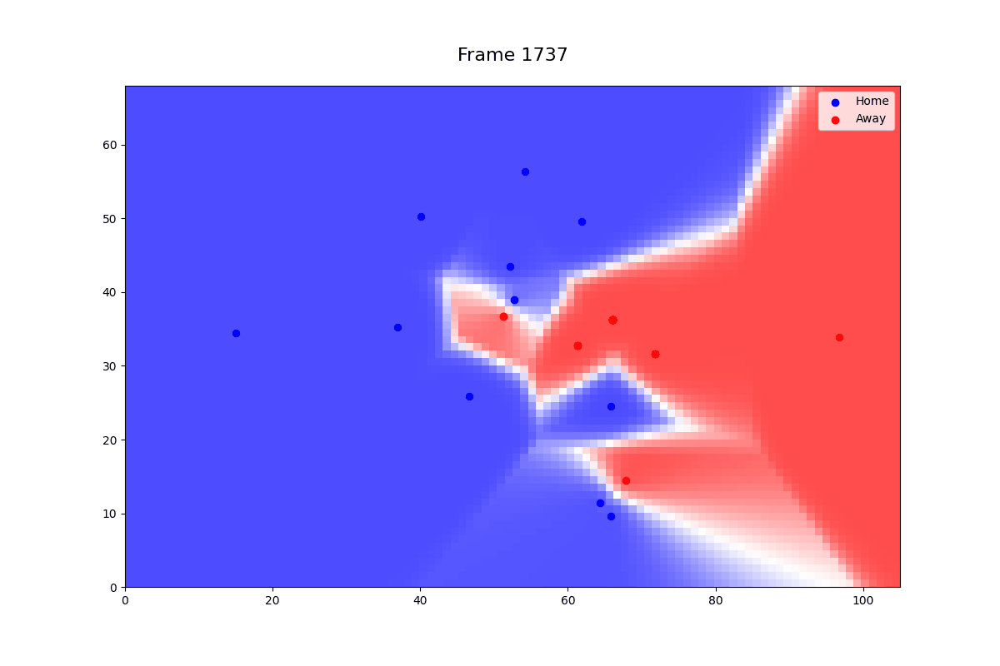

In [18]:
from IPython.display import Image
Image(filename="pitch_control_animation.gif")

# tracking 


In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.gridspec import GridSpec
from IPython.display import HTML

players = pd.read_parquet("13594/players.parquet")
field_length = 105
field_width = 68
frame_ids = sorted(players['frame_id'].dropna().unique())
frame_ids = frame_ids[::30]  # densidade de frames
frame_ids = frame_ids[:300]  #qtd de frames


fig = plt.figure(figsize=(12, 8)) 
gs = GridSpec(1, 1, figure=fig) 
ax = fig.add_subplot(gs[0, 0]) 

# gramado
def setup_pitch(ax):
    ax.set_facecolor("green")
    ax.set_xlim(0, field_length)
    ax.set_ylim(0, field_width)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal') 
    ax.plot([field_length/2, field_length/2], [0, field_width], color='white')
    ax.plot([0, field_length], [0, 0], color='white') 
    ax.plot([0, field_length], [field_width, field_width], color='white')
    ax.plot([0, 0], [0, field_width], color='white') 
    ax.plot([field_length, field_length], [0, field_width], color='white')
    ax.add_patch(plt.Circle((field_length/2, field_width/2), 9.15, color='white', fill=False))

setup_pitch(ax)

scat_home = ax.scatter([], [], c='red', label='home', s=50, edgecolors='black') 
scat_away = ax.scatter([], [], c='blue', label='away', s=50, edgecolors='black') 
title = ax.text(0.5, 1.02, '', transform=ax.transAxes, ha='center', va='bottom', color='white', fontsize=12) 

#animacao
def update(frame_idx):
    fid = frame_ids[frame_idx]
    data = players[players['frame_id'] == fid]
    home = data[data['team'] == 'home']
    away = data[data['team'] == 'away']
    home_x = home['x'] + field_length/2
    home_y = home['y'] + field_width/2
    away_x = away['x'] + field_length/2
    away_y = away['y'] + field_width/2

    scat_home.set_offsets(np.column_stack((home_x, home_y)))
    scat_away.set_offsets(np.column_stack((away_x, away_y)))
    
    title.set_text(f"Frame {fid}")
    
    return scat_home, scat_away, title

anim = FuncAnimation(fig, update, frames=len(frame_ids), interval=300, blit=True)
display(HTML(anim.to_jshtml()))
plt.close(fig)


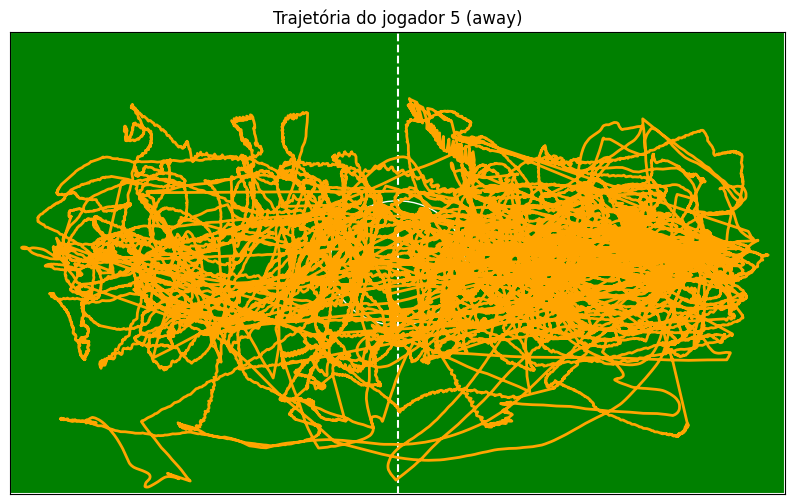

In [20]:
camisa = 5
time = "away"
traj = players[(players['shirt'] == camisa) & (players['team'] == time)]

fig, ax = plt.subplots(figsize=(10, 6))
plot_pitch(ax)

ax.plot(traj['x'] + 52.5, traj['y'] + 34, color="orange", linewidth=2)
ax.set_title(f"Trajetória do jogador {camisa} ({time})")
plt.show()
